# <span style="color:orange">Quality Data Analysis - Project Work </span>
## Team 58

### Course Details:
- Academic Year: 2022-2023

### Project Details:
- Title: Design a statistical process monitoring method for the in-line detection of defects by minimizing the false alarm

### Team Members:
- Morandi Francesco 10672241
- Petri Alessandro 10824538
- Rossi Lucrezia 10584777
- Schiavone Alberto 10868308

### Instructor:
- Panagiotis Tsiamyrtzis

# Introduction

The project is based on designing a statistical process monitoring method for the in-line detection of defects affecting 3D parts printed by HP Multijet-Fusion process. The parts that have been analyzed are polymer PC fan covers.
The dataset consists of 58 samples, acquired by a machine in the laboratory. Each sample contains parts that can be in-control, which means defect free, and defective. Four type of defects can be detected: missing material along the border, broken or missing material in the corner, broken or missing struts and severe lack of struts.

First, we perform a design phase, by using 20 images of parts from the 'In control' folder in order to build reliable limits to use later to analyze the images of remaining good parts and the defected parts.
During the initial phase of our analysis, we perform rotation, cropping and binarization operations on the images. These operations are carried out with the objective of ensuring the accuracy and effectiveness of our subsequent analysis. Subsequently, we extract the necessary descriptive parameters to accurately describe the part. The parameters that we extracted are:
- The external perimeter
- The internal perimeter
- The area of the component
- The area of the holes
- The number of holes

To create our model we check the following assumption for all the descriptive statistics extracted:
1. Normality with the Shapiro-Wilk test
2. Randomness through the runs test
3. Autocorrelation function

We build the control chart considering only 20 images of good components assuming K = 3.
Using the limits and the mean obtained in the model's construction, we tested each variable for all the samples.
On the basis of the results obtained, the team tried to create new charts with the purpose of classifying and differentiating each type of defect from the others.


# Assumptions

The dataset is made of 58 images, where 30 are images of free-defects parts and 28 are images of defected parts.
The components could be affected by four type of defectes which are
- broken side
- broken corner
- severe lack of struts
- broken or missing struts

During the acquisition of the images, the team decides to scan one component per time positioned in the center of the line in order to facilitate the image acquisition and the later analysis.

We assumed the images to contain some noise so, in order to reduce as much as possible the noise from the background, we cropped the images and subtructed the background before the binarization.

Since we wanted to simulate an authentic industrial process, we decided to consider only a part of the in-control images ensamble to build the model and the other part of the in-control group of images was analysed together with the defected parts images. Moreover, to create a process that closely resembles reality, we randomized the parameter dataframe extracted from the images by row.

In the design phase we assumed that our data follows a normal distribution and they are independent. These assumptions were verified through the Shapiro-Wilk test and the run test.

Once the design phase is completed we tested all the remaining images on the basis of the results obtained before. At the end we tried to distinguish one defect from each other.
Some parameters calculated for defective images, used to distinguish one defect from another one, do not adhere to the assumptions of normality and independence due to the presence of those defects. Defective images may introduce distorsions in the data and furthermore, the assumption of independence may be violated due to the presence of correlated defects or recurring patterns within the images.

Additionally, a small sample size can impact the validity of statistical assumptions because with a reduced sample, the ability to detect normality may be limited, and the interpretation of statistical tests may be less reliable. The violation of the assumption of independence can be more pronounced with smaller samples, as correlations can be more evident and less attenuated.

For all of these reasons we checked the normality and independence of data to build our model and during the last phase of our analysis we do not check the veridicity of these assumptions,  so we assumed that for a larger number of images the assumptions will be verified.

The control charts were designed assuming K = 3.

# Proposed Methodology

The proposed methodology is mainly based into three steps:
1. The first step is based on a design phase. In this initial phase we first consider only 20 images of good parts and we prepare the images to be analyzed by rotating, cropping and binarizing the images.
In the following piece of code we prepared the images to be analyzed and we plotted all the results obtained.
We plotted the binarized and cropped images and the external and internal contours of the components.
Some sections of the code have been commented to print only the most significant parts.


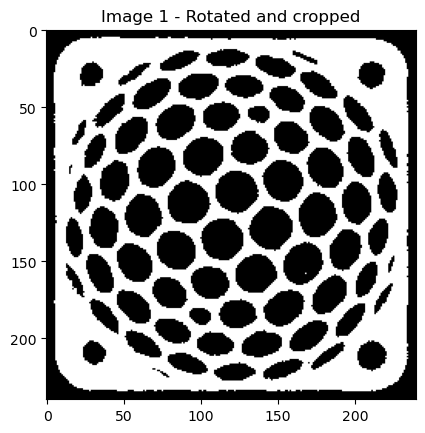

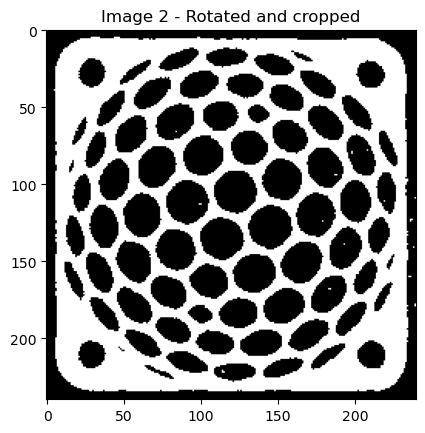

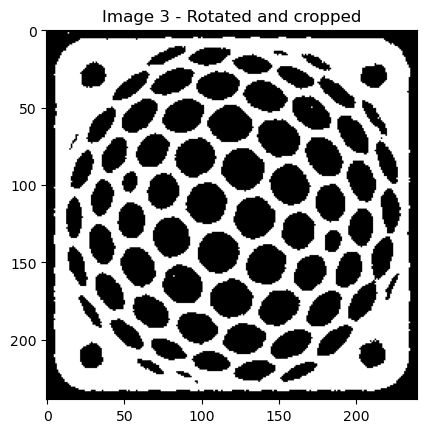

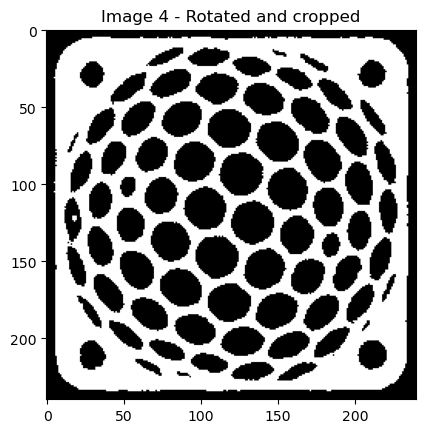

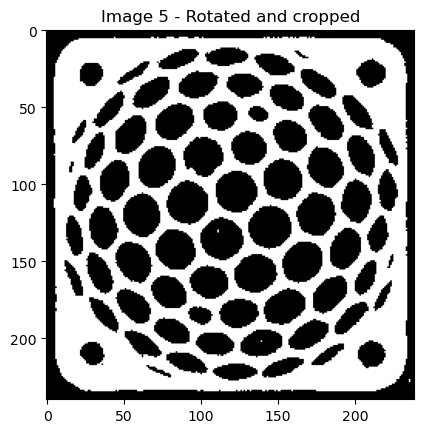

...

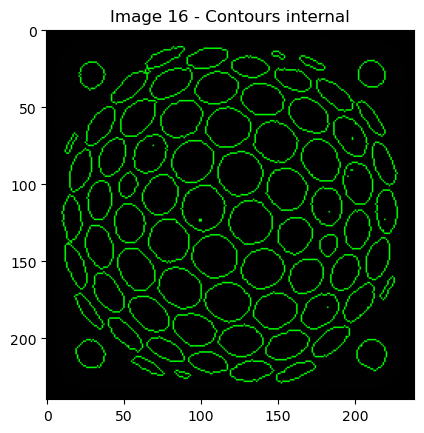

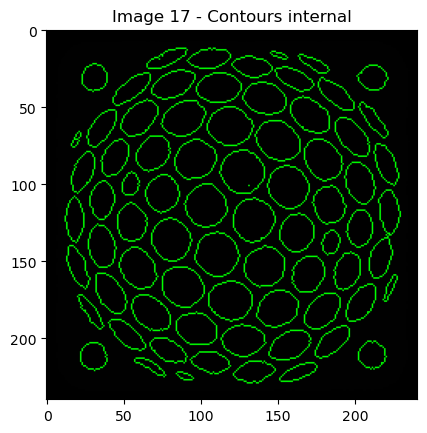

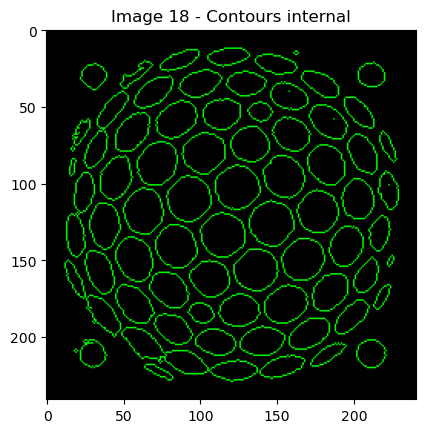

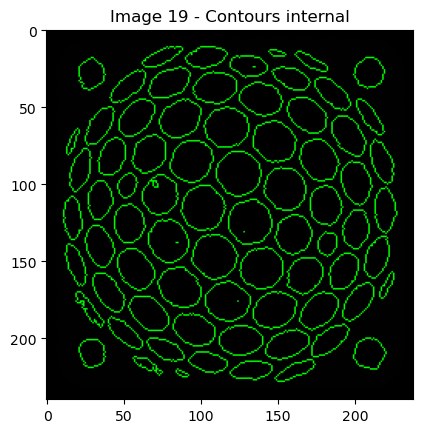

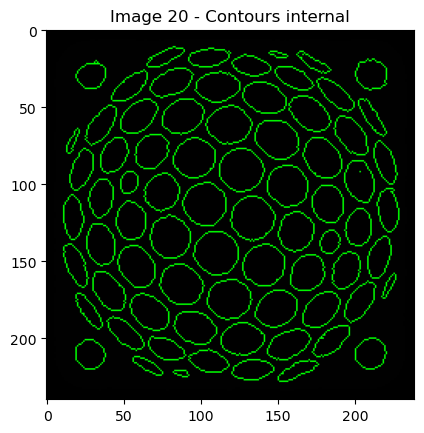

In [ ]:
# Import of the necessary libraries
from PIL import Image
import skimage
import numpy as np
from skimage import io, morphology, measure
import matplotlib.pyplot as plt
import cv2
import os
import pandas as pd

# Uploading the images
image_files = ["/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/1.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/2.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/3.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/4.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/5.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/6.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/7.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/8.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/9.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/10.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/11.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/12.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/13.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/14.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/15.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/16.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/17.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/18.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/19.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/In control/20.bmp"]

images = []
for i, file in enumerate(image_files):
    image = cv2.imread(file)
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    images.append(gray)


background = morphology.disk(15)
binary=[]
image_subtracted=[]
for i in range(len(images)):
 #Subtraction of background
    background_opened = morphology.opening(images[i], background)
    image_subtracted.append( np.abs(images[i] - background_opened))

    # Binarization of images
    threshold = skimage.filters.threshold_otsu(image_subtracted[i])
    binary.append(image_subtracted[i] > threshold-10) # The threshold was reduced to ensure a good binarization for all images

    # Show the binarized images
    #plt.imshow(binary[i], cmap='gray')
    #plt.title(f"Image {i+1} - Binarized")
    #plt.show()

    binary_01 = []
for i in range(len(binary)):
    binary_01.append(binary[i].astype(np.uint8))

rotated_images = []
for i in range(len(binary)):
    contours, _ = cv2.findContours(binary_01[i], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)

    rect = cv2.minAreaRect(largest_contour)
    angle = rect[-1]

    rows, cols = binary_01[i].shape[:2]
    rotation_matrix = cv2.getRotationMatrix2D((cols / 2, rows / 2), angle, 1)
    rotated_image = cv2.warpAffine(binary_01[i], rotation_matrix, (cols, rows))
    rotated_images.append(rotated_image)

cropped_image = []
for i in range(len(binary)):
    contours, _ = cv2.findContours(rotated_images[i], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    rect = cv2.minAreaRect(largest_contour)
    box = cv2.boxPoints(rect)
    box = np.int0(box)

    x, y, w, h = cv2.boundingRect(box)
    cropped_image.append(rotated_images[i][(y-5):(y+h+5), (x-5):(x+w+5)])

# Show images binarized and cropped
    plt.imshow(cropped_image[i],cmap='gray')
    plt.title(f"Image {i+1} - Rotated and cropped")
    plt.show()

# Defining the external and internal perimeter of parts
image_contours_ext = []
image_contours_int = []
contours_ext = []
contours_int = []
for i in range(len(cropped_image)):
 contours, hierarchy = cv2.findContours(cropped_image[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours=[]
 external_contours=[]

 for j in range(len(contours)):
    if hierarchy[0][j][3]==-1:
            external_contours.append(contours[j])
    else:
            internal_contours.append(contours[j])
 contours_ext.append(external_contours)
 contours_int.append(internal_contours)

 image_contours_ext.append(cv2.cvtColor(cropped_image[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext[i], external_contours, -1, (0,255,0),1)
 image_contours_int.append(cv2.cvtColor(cropped_image[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int[i], internal_contours, -1, (0,255,0),1)

# Show the external contours of parts
for i in range(len(cropped_image)):
 plt.imshow(image_contours_ext[i], cmap='gray')
 plt.title(f"Image {i+1} - Contours external")
 plt.show()

# Show the internal contours of parts
for i in range(len(cropped_image)):
 plt.imshow(image_contours_int[i], cmap='gray')
 plt.title(f"Image {i+1} - Contours internal")
 plt.show()

The team proceeds the analysis by extracting the descriptive properties of the images.
In the subsequent piece of code we reported the calculations for the following parameters:
- External perimeter
- Internal perimeter
- Area
- Number of holes
- Area of holes

Then, we resumed all the values in a data frame made of 5 columns (one for each descriptive parameter) and 20 rows (one for each image)

In [ ]:
# Calculations for external perimeter
external_perimeter = []

for i in range(len(binary)):
    perimeters = [cv2.arcLength(contour, True) for contour in contours_ext[i]]
    # we consider the maximum external contour
    external_perimeter.append(max(perimeters))


# Calculations for internal perimeter
internal_perimeter = []

for i in range(len(binary)):
    perimeters = [cv2.arcLength(contour, True) for contour in contours_int[i]]
    # We consider the sum of the internal contours
    internal_perimeter.append(sum(perimeters))

#Number and area of holes
area_holes=[]
for i in range(len(cropped_image)):
 labels=skimage.measure.label(255-cropped_image[i])
 props= skimage.measure.regionprops(labels)
 area = [prop.area for prop in props]
 area_holes.append(area)

n_buchi = []
dim_buchi = []
for i in range(len(area_holes)):
      index_remove=[]
      for j in range(len(area_holes[i])):
            if not 15 < area_holes[i][j] < 1000: # We consider these thresholds to consider into the calculation only the effective area of holes
                index_remove.append(j)

      index_remove.sort(reverse=True)
      for index in index_remove:
          del area_holes[i][index]

      n_buchi.append(len(area_holes[i])) # Number of holes
      dim_buchi.append(sum(area_holes[i])) # Area of holes

# White area calculations
white_areas = []

for i in range(len(cropped_image)):
    # White area calculation
    white_area = cv2.countNonZero(cropped_image[i])
    white_areas.append(white_area)

# Sum of all the areas of each single hole
area_holes2=[]
for i in range (len(cropped_image)):
        area_holes2.append(sum(area_holes[i]))


# Creation of the DataFrame
df = pd.DataFrame({

    'External Perimeter': external_perimeter,
    'Internal Perimeter': internal_perimeter,
    'White area': white_areas,
    'Number of holes': n_buchi,
    'Area holes': area_holes2
})

# Print the DataFrame
print(df)

    External Perimeter  Internal Perimeter  White area  Number of holes  \
0           930.173660         5333.782408       28812               72   
1           923.788885         5427.120503       27885               73   
2           928.173661         5397.162133       28652               72   
3           917.989895         5473.990561       28156               74   
4           924.617312         5327.882914       28770               73   
5           930.558437         5456.091062       27771               73   
6           928.173661         5204.929598       29566               71   
7           933.386864         5415.463647       28312               72   
8           923.445739         5456.392581       27973               74   
9           922.132030         5328.350946       28924               71   
10          927.830515         5401.338757       28418               74   
11          937.043718         5387.380387       28412               74   
12          938.457932   

\Now the team proceeded with the analysis by checking the assumptions of normality and randomness, also plotting the autocorrelation function. We repeated this procedure for all the parameters calculated previously.

Statistic = 0.961, p-value = 0.572
Data of External Perimeter follows normal distribution


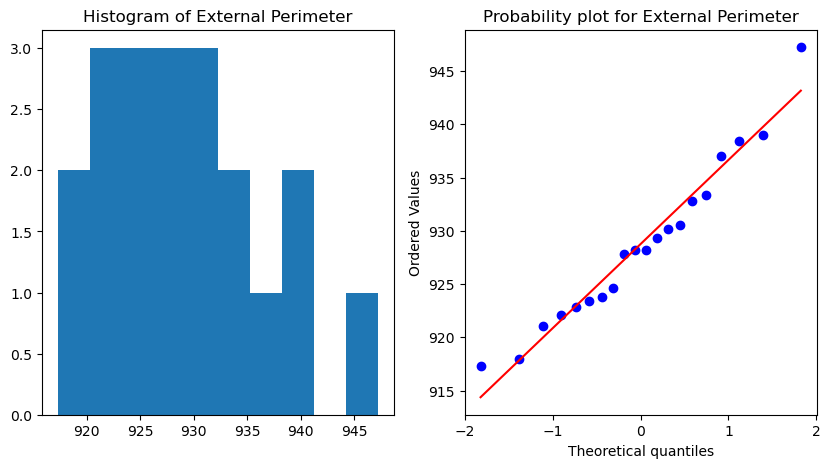

Statistic = 0.936, p-value = 0.200
Data of Internal Perimeter follows normal distribution


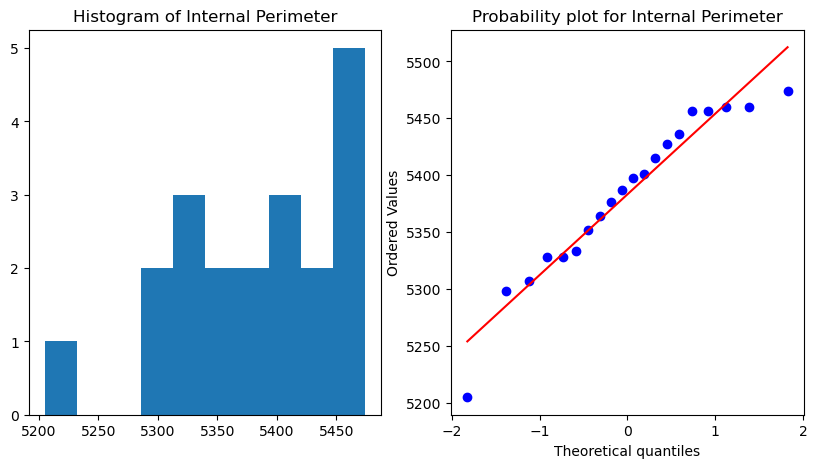

Statistic = 0.976, p-value = 0.866
Data of White area follows normal distribution


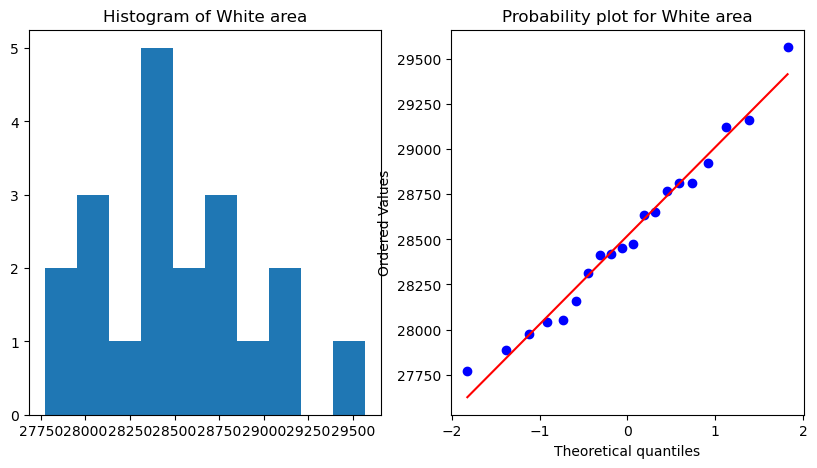

Statistic = 0.846, p-value = 0.005
Data of Number of holes does not follow normal distribution


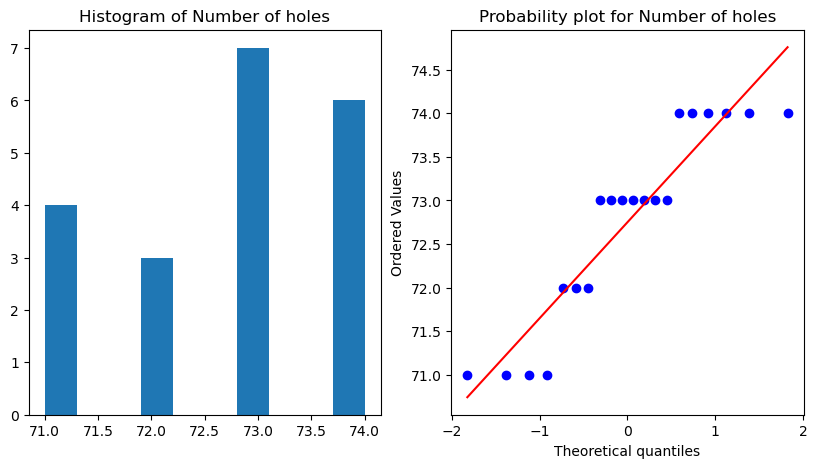

Statistic = 0.955, p-value = 0.443
Data of Area holes follows normal distribution


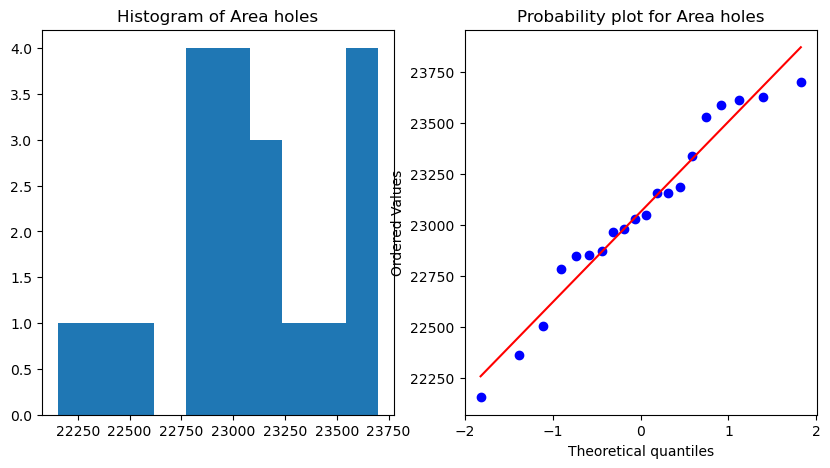

In [ ]:
#Shapiro-Wilk test for all parameters
from scipy import stats
from scipy.stats import shapiro
import matplotlib.pyplot as plt

parameters = ['External Perimeter', 'Internal Perimeter', 'White area', 'Number of holes', 'Area holes']

for parameter in parameters:
    values = df[parameter]
    statistic, p_value = shapiro(values)

    print(f'Statistic = {statistic:.3f}, p-value = {p_value:.3f}')

    alpha = 0.05
    if p_value < alpha:
        print(f'Data of {parameter} does not follow normal distribution')
    else:
        print(f'Data of {parameter} follows normal distribution')

    # Plot of histogram and probability plot
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].hist(values)
    axs[0].set_title(f'Histogram of {parameter}')

    stats.probplot(values, dist="norm", plot=axs[1])
    plt.title(f'Probability plot for {parameter}')
    plt.show()


As we can see from the graphs, all the parameters follow the normal distribution except for the number of holes.
In the following piece of code the team has tested the randomness of the data through the runs test and we plotted the autocorrelation function.

In [ ]:
# Run test for all the parameters
from statsmodels.sandbox.stats.runs import runstest_1samp # import the library

for parameter in parameters:
    values = df[parameter]
    _, pval_runs = runstest_1samp(values, correction=False)
    print('Runs test p-value = {:.3f}'.format(pval_runs))
    if pval_runs<alpha:
     print(f'The null hypothesis is rejected: For {parameter} the process is not random')
    else:
     print(f'The null hypothesis is accepted: for {parameter} the process is random')

Runs test p-value = 0.676
The null hypothesis is accepted: for External Perimeter the process is random
Runs test p-value = 0.329
The null hypothesis is accepted: for Internal Perimeter the process is random
Runs test p-value = 0.150
The null hypothesis is accepted: for White area the process is random
Runs test p-value = 0.335
The null hypothesis is accepted: for Number of holes the process is random
Runs test p-value = 0.329
The null hypothesis is accepted: for Area holes the process is random


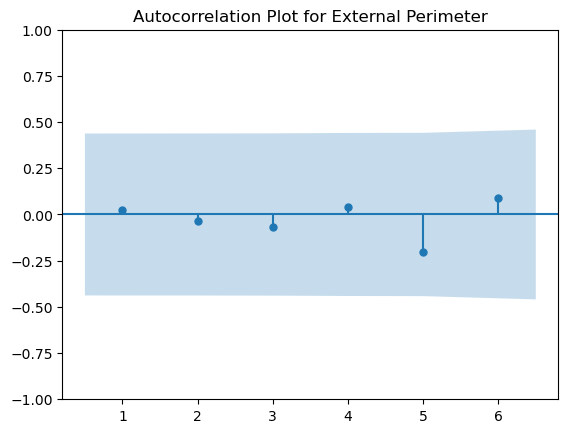

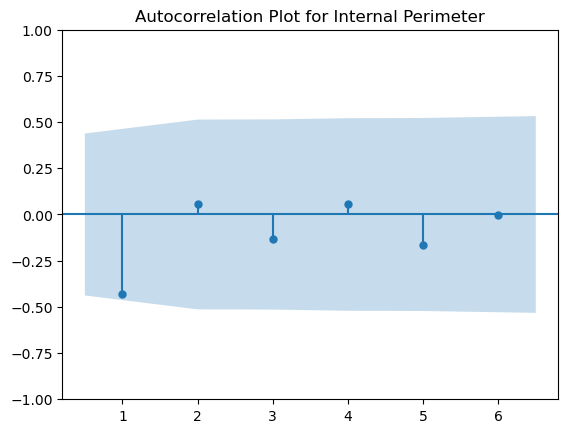

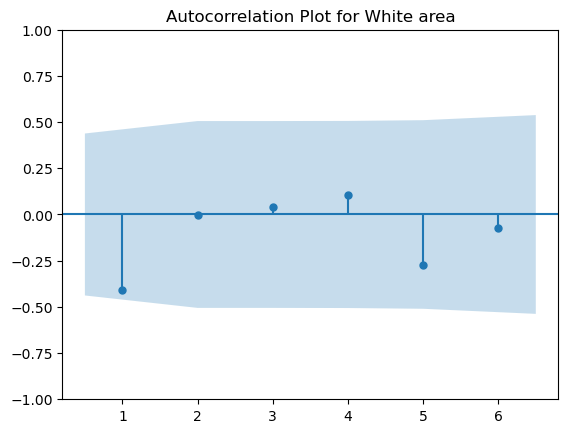

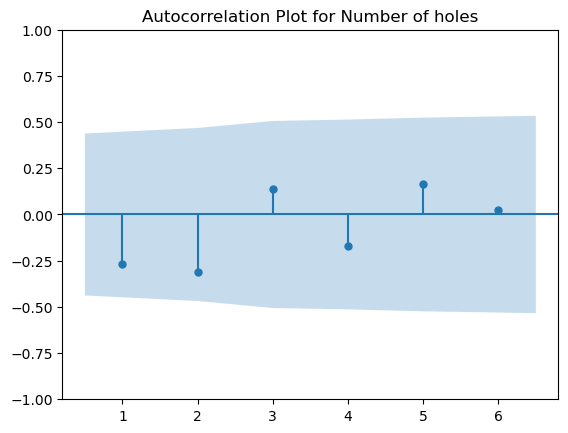

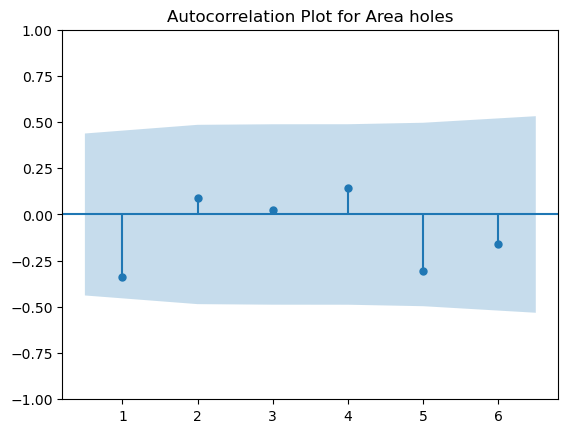

In [ ]:
# Plot the autocorrelation of all the parameters
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_acf


for parameter in parameters:
    values = df[parameter]
    n = len(values)

    # Plot ACF
    fig, ax = plt.subplots()
    plot_acf(values, lags=int(n / 3), zero=False, ax=ax)
    ax.set_title(f'Autocorrelation Plot for {parameter}')
    plt.show()


All the data of the parameter statistics seems to be not autocorrelated.

All parameters are in control, except for the parameter related to the number of holes, which violates the normality assumptions. Consequently, we have made the decision to exclude this particular parameter from further analysis.

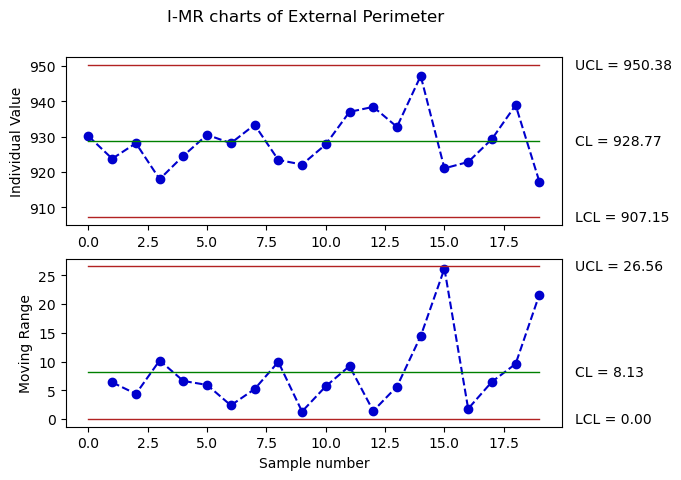

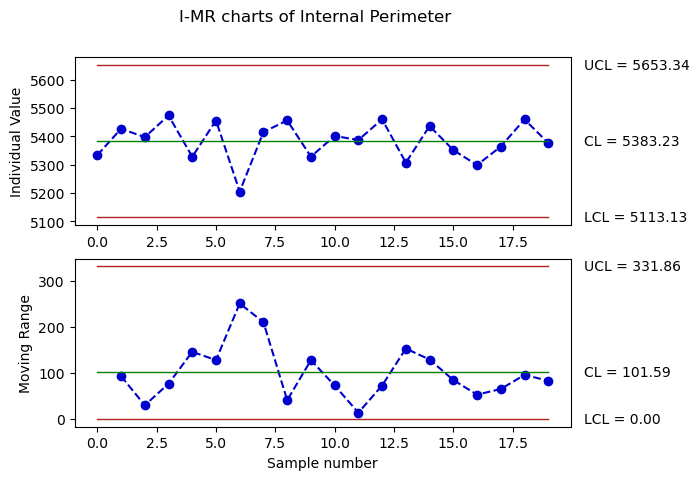

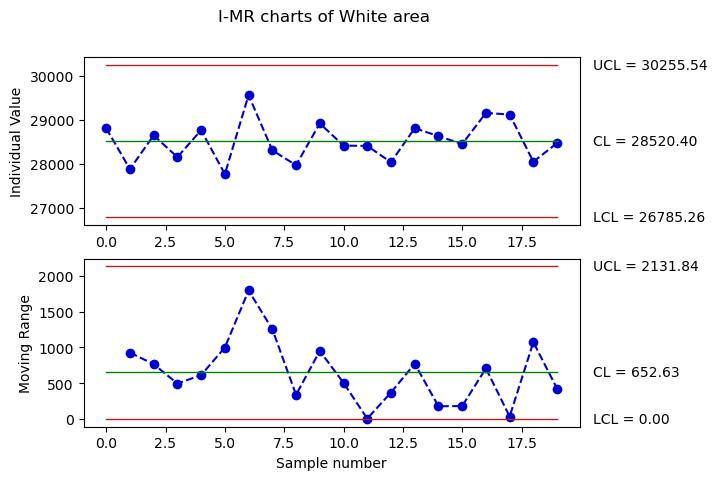

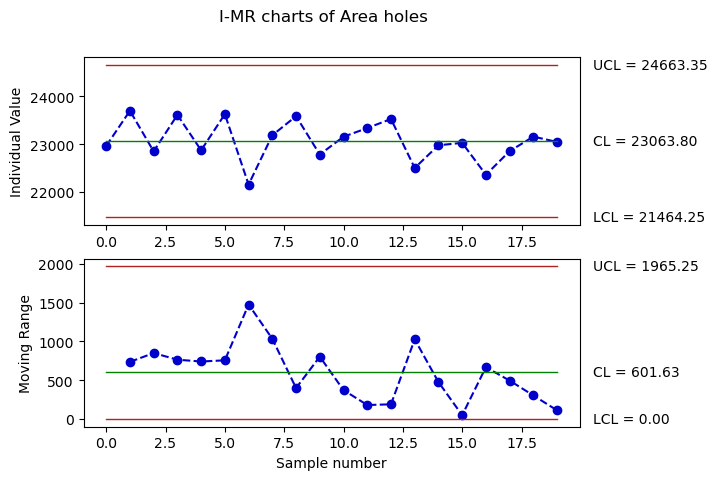

In [ ]:
import qda
data_IMR_EP = qda.ControlCharts.IMR(df, 'External Perimeter',K=3, subset_size=len(df))
data_IMR_IP = qda.ControlCharts.IMR(df, 'Internal Perimeter',K=3, subset_size=len(df))
data_IMR_A = qda.ControlCharts.IMR(df, 'White area',K=3, subset_size=len(df))
data_IMR_AH = qda.ControlCharts.IMR(df, 'Area holes',K=3, subset_size=len(df))

As we can see from these I-MR charts, all the parameters are in control.

*   List item
*   List item




2. In the second phase, since now our model is built, we proceeded with testing the remaining images using the chart we have already created. We repeated the same procedure with the new set of images, referred to as images to test, and plotted the corresponding values on the chart. Utilizing the limits established by our model, we can identify the defective images.

Since the parameter "Number of holes" violates the normality assumption, we applied a box-cox transformation on the data resulting in the normality of the sample. Nevertheless, this parameter did not help in distinguishing the defected pieces from the in-control ones, so the team decided to exclude it for the purpose of the analysis and in the following part of the code the parameter is not present.

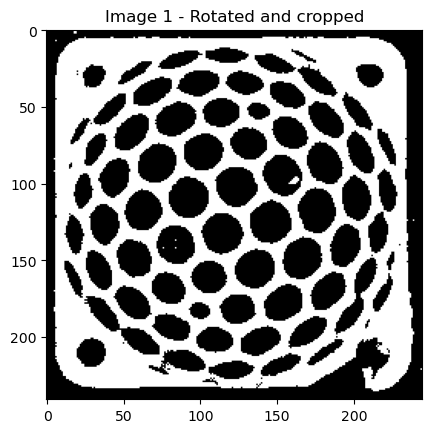

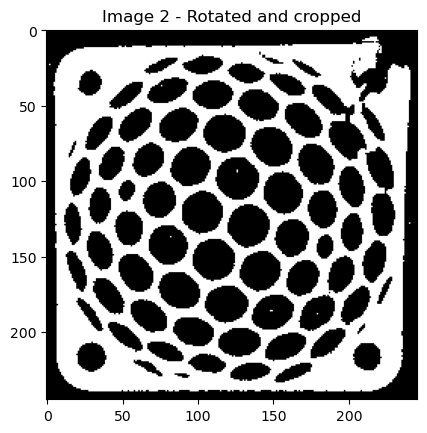

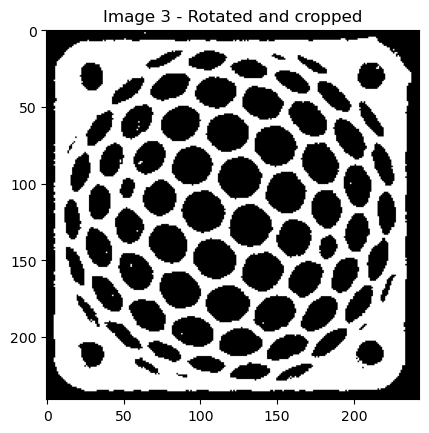

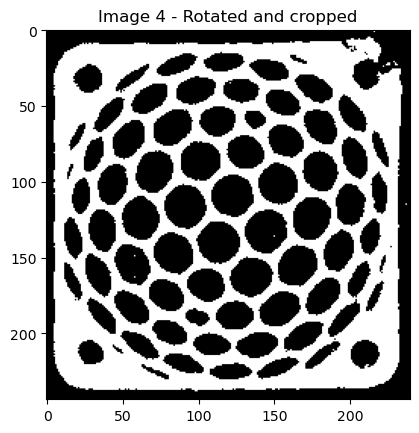

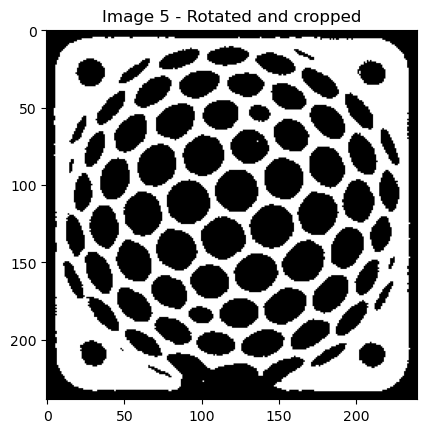

...

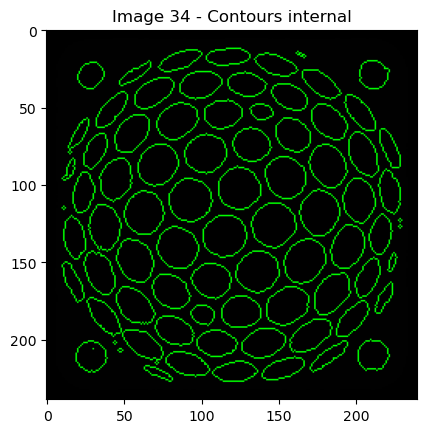

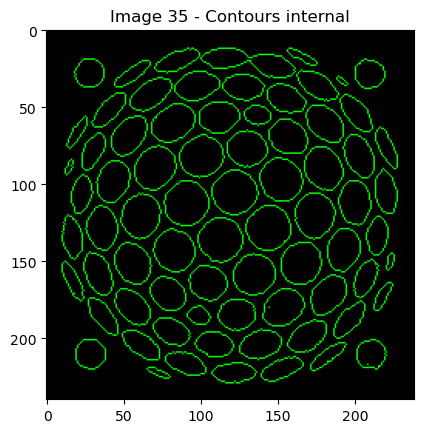

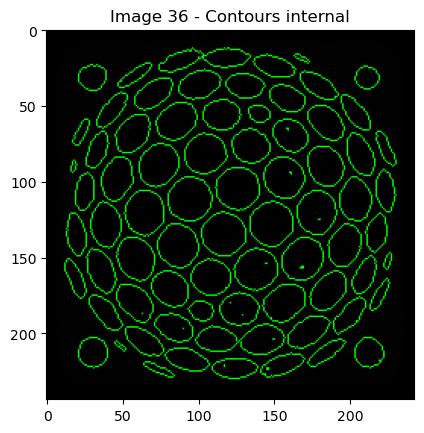

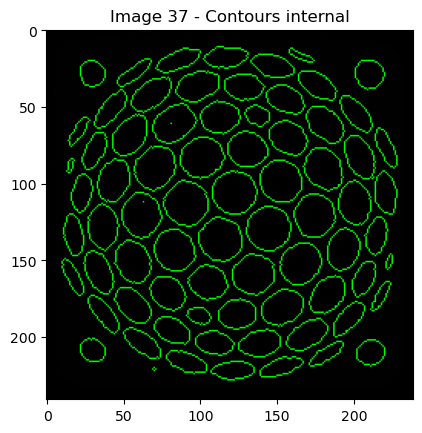

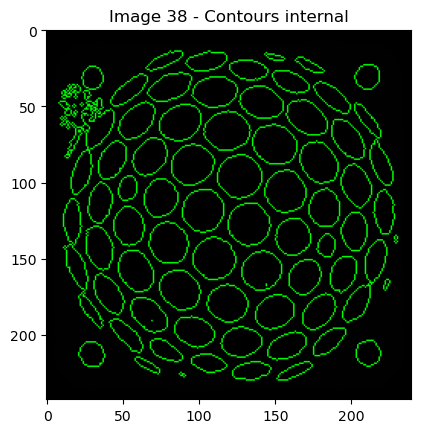

In [ ]:
# Loading of images to be tested
image_filesTT = ["/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/1.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/2.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/3.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/4.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/5.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/6.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/7.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/8.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/9.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/10.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/11.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/12.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/13.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/14.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/15.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/16.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/17.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/18.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/19.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/20.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/21.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/22.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/23.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/24.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/25.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/26.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/27.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/28.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/29.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/30.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/31.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/32.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/33.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/34.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/35.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/36.bmp",
              "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/37.bmp",
               "/Users/lucreziarossi/Documents/Ingegneria Meccanica LM/Anno 2022:2023/Quality Data Analysis/Project_QDA/Images/ImagesTot/38.bmp"]


imagesTT = []
for i_TT, file_TT in enumerate(image_filesTT):
    imageTT = cv2.imread(file_TT)
    grayTT = cv2.cvtColor(imageTT, cv2.COLOR_RGB2GRAY)
    imagesTT.append(grayTT)


# Binarization of images
binaryTT=[]
image_subtractedTT=[]
for i in range(len(imagesTT)):
 # Background subtraction
    background_openedTT = morphology.opening(imagesTT[i], background)
    image_subtractedTT.append( np.abs(imagesTT[i] - background_openedTT))

    # Binarization
    thresholdTT = skimage.filters.threshold_otsu(image_subtractedTT[i])
    binaryTT.append(image_subtractedTT[i] > thresholdTT-10)

    # Show binarized images
    #plt.imshow(binaryTT[i], cmap='gray')
    #plt.title(f"Image {i+1} - Binarized")
    #plt.show()

    binary_01TT = []
for i in range(len(binaryTT)):
    binary_01TT.append(binaryTT[i].astype(np.uint8))

rotated_imagesTT = []
for i in range(len(binaryTT)):
    contoursTT, _ = cv2.findContours(binary_01TT[i], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contourTT = max(contoursTT, key=cv2.contourArea)

    rectTT = cv2.minAreaRect(largest_contourTT)
    angleTT = rectTT[-1]

    rowsTT, colsTT = binary_01TT[i].shape[:2]
    rotation_matrixTT = cv2.getRotationMatrix2D((colsTT / 2, rowsTT / 2), angleTT, 1)
    rotated_imageTT = cv2.warpAffine(binary_01TT[i], rotation_matrixTT, (colsTT, rowsTT))
    rotated_imagesTT.append(rotated_imageTT)

cropped_imageTT = []
for i in range(len(binaryTT)):
    contoursTT, _ = cv2.findContours(rotated_imagesTT[i], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contourTT = max(contoursTT, key=cv2.contourArea)
    rectTT = cv2.minAreaRect(largest_contourTT)
    boxTT = cv2.boxPoints(rectTT)
    boxTT = np.int0(boxTT)

    xTT, yTT, wTT, hTT = cv2.boundingRect(boxTT)
    cropped_imageTT.append(rotated_imagesTT[i][(yTT-5):(yTT+hTT+5), (xTT-5):(xTT+wTT+5)])

    # Show rotated and cropped binarized images
    plt.imshow(cropped_imageTT[i],cmap='gray')
    plt.title(f"Image {i+1} - Rotated and cropped")
    plt.show()

# Definition of internal and external contours
image_contours_extTT = []
image_contours_intTT = []
contours_extTT = []
contours_intTT = []
for i in range(len(cropped_imageTT)):
 contoursTT, hierarchyTT = cv2.findContours(cropped_imageTT[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contoursTT=[]
 external_contoursTT=[]

 for j in range(len(contoursTT)):
    if hierarchyTT[0][j][3]==-1:
            external_contoursTT.append(contoursTT[j])
    else:
            internal_contoursTT.append(contoursTT[j])
 contours_extTT.append(external_contoursTT)
 contours_intTT.append(internal_contoursTT)

 image_contours_extTT.append(cv2.cvtColor(cropped_imageTT[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_extTT[i], external_contoursTT, -1, (0,255,0),1)
 image_contours_intTT.append(cv2.cvtColor(cropped_imageTT[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_intTT[i], internal_contoursTT, -1, (0,255,0),1)
 # Show the external contours of parts
for i in range(len(cropped_imageTT)):
 plt.imshow(image_contours_extTT[i], cmap='gray')
 plt.title(f"Image {i+1} - Contours external")
 plt.show()

# Show the internal contours of parts
for i in range(len(cropped_imageTT)):
 plt.imshow(image_contours_intTT[i], cmap='gray')
 plt.title(f"Image {i+1} - Contours internal")
 plt.show()


Based on the analysis of these images, the first four images depict the broken corner type, followed by eight images displaying the broken side type, another eight representing hole-defect images, followed by eight images showing missing struts, and finally, the last ten images are in-control images. Subsequently, we plan to randomize all the images to create a more realistic simulation.

The team would like to draw attention to image 3. Although it belongs to the broken corner type, the original image's defect is not well captured, resulting in a failed binarization.

Furthermore, image 38 is another example of poor binarization. It is an in-control image, and despite having good image quality, the binarization process failed. Even after attempting to modify the threshold, we were unable to improve the situation.

In [ ]:
# Calculations of the following parameters: external and internal perimeters, total white area and area of holes
# Calculations for external perimeter
external_perimeterTT = []

for i in range(len(binaryTT)):
    # Calculation of perimeter of external contours
    perimetersTT = [cv2.arcLength(contourTT, True) for contourTT in contours_extTT[i]]
    # Take the maximum perimeter
    external_perimeterTT.append(max(perimetersTT))


# Calculations for internal perimeter
internal_perimeterTT = []

for i in range(len(binaryTT)):
    # Calculation of perimeter of internal contours
    perimetersTT = [cv2.arcLength(contourTT, True) for contourTT in contours_intTT[i]]
    # Sum of all the internal contours per each image
    internal_perimeterTT.append(sum(perimetersTT))


#Number of holes and area holes
area_holesTT=[]
for i in range(len(cropped_imageTT)):
 labelsTT=skimage.measure.label(255-cropped_imageTT[i])
 propsTT= skimage.measure.regionprops(labelsTT)
 areaTT = [propTT.area for propTT in propsTT]
 area_holesTT.append(areaTT)

n_buchiTT = []
dim_buchiTT = []
for i in range(len(area_holesTT)):
      index_removeTT=[]
      for j in range(len(area_holesTT[i])):
            if not 15 < area_holesTT[i][j] < 1000:
                index_removeTT.append(j)

      index_removeTT.sort(reverse=True)
      for indexTT in index_removeTT:
          del area_holesTT[i][indexTT]

      n_buchiTT.append(len(area_holesTT[i]))
      dim_buchiTT.append(sum(area_holesTT[i]))

white_areasTT = []

for i in range(len(cropped_imageTT)):
    # Calculation white area
    white_areaTT = cv2.countNonZero(cropped_imageTT[i])
    white_areasTT.append(white_areaTT)


area_holes2TT=[]
for i in range (len(cropped_imageTT)):
        area_holes2TT.append(sum(area_holesTT[i]))

# Creation of the DataFrame of parameters of images to test
df_TT = pd.DataFrame({

    'External Perimeter': external_perimeterTT,
    'Internal Perimeter': internal_perimeterTT,
    'White area': white_areasTT,
    'Number of holes': n_buchiTT,
    'Area holes': area_holes2TT
})

# We added a column that assigns per each image its code BC, BS, H, MS or IC which corresponds to its part type
part_type = ['BC','BC','BC','BC','BS','BS','BS','BS','BS','BS','BS','BS','H','H','H','H','H','H','H','H','MS','MS','MS','MS','MS','MS','MS','MS','IC','IC','IC','IC','IC','IC','IC','IC','IC','IC']
df_TT['part type'] = part_type
print(df_TT)
# Here we made the dataframe random and we kept the randomization constant, which means that each time we executed the command we got the same result, the random sample is identical
df_TT_random = df_TT.sample(frac=1, random_state=42).reset_index(drop=True)

# Print the randomized dataframe
print(df_TT_random)

    External Perimeter  Internal Perimeter  White area  Number of holes  \
0          1028.256921         5521.831178       28477               71   
1          1065.227483         5485.588539       27965               71   
2           947.327988         5416.233200       28888               72   
3          1014.499561         5488.860616       27338               73   
4          1025.369619         5208.811844       27110               71   
5          1101.126978         5225.297127       26942               70   
6           960.842707         5318.368190       28315               72   
7          1013.913775         5405.120503       27354               72   
8          1080.097540         5333.564154       27225               70   
9          1003.570630         5128.586451       28549               70   
10         1008.499561         5424.108310       26917               70   
11         1067.997034         5184.385439       28199               71   
12          932.658942   

Now that we have obtained the parameter values for each image, we can proceed with our analysis by comparing the values of the images under test with the values calculated during the design phase. This comparison is performed by plotting all the values on the corresponding chart and identifying any values that fall outside the established limits. For those values, we print the parameter value and the corresponding part type.

/var/folders/5_/sz2q2pt56t7b8qnh39wv_hnm0000gn/T/ipykernel_4220/3881317455.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data_tot=df.append(df_TT_random,ignore_index=True)


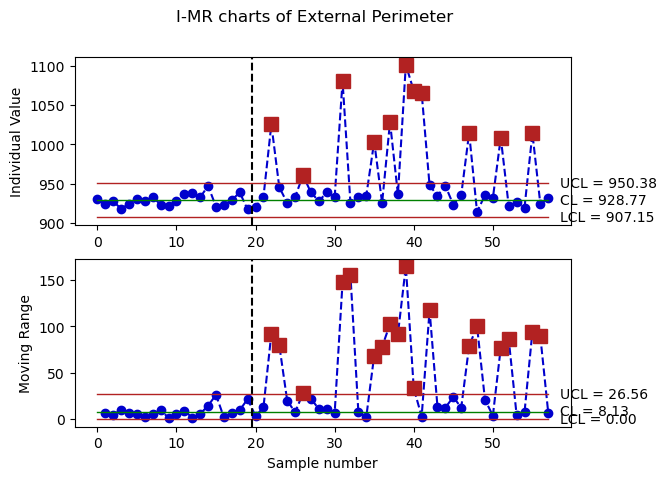

The part 3 is defected along the external perimeter
The part 7 is defected along the external perimeter
The part 12 is defected along the external perimeter
The part 16 is defected along the external perimeter
The part 18 is defected along the external perimeter
The part 20 is defected along the external perimeter
The part 21 is defected along the external perimeter
The part 22 is defected along the external perimeter
The part 28 is defected along the external perimeter
The part 32 is defected along the external perimeter
The part 36 is defected along the external perimeter
Defect Data:
3 BS 1025.3696185350418
7 BS 960.8427070379257
12 BS 1080.0975403785706
16 BS 1003.5706298351288
18 BC 1028.2569208145142
20 BS 1101.1269776821136
21 BS 1067.9970341920853
22 BC 1065.2274829149246
28 BC 1014.4995613098145
32 BS 1008.4995613098145
36 BS 1013.9137749671936


In [ ]:
data_tot=df.append(df_TT_random,ignore_index=True)

# External perimeter
data_IMR_EP = qda.ControlCharts.IMR(data_tot, 'External Perimeter',K=3, subset_size=len(df))

# Print the defective images
d2 = 1.128
D4 = 3.267

valuesEP=df['External Perimeter']
moving_rangeEP = valuesEP.diff().abs()
mean_rangeEP = np.mean(moving_rangeEP)
meanEP = np.mean(valuesEP)
valuesEP_TT = df_TT_random['External Perimeter']

UCL_I_EP = meanEP + (3*mean_rangeEP/d2)
CL_I_EP = meanEP
LCL_I_EP = meanEP - (3*mean_rangeEP/d2)
UCL_MR_EP = D4*mean_rangeEP
CL_MR_EP = mean_rangeEP
LCL_MR = 0

defect_indices = []
part_type_defect = []
defect_values_EP = []

for i in range(len(cropped_imageTT)):
    if valuesEP_TT[i] > UCL_I_EP or valuesEP_TT[i] < LCL_I_EP:
        defect_indices.append(i+1)
        part_type_defect.append(df_TT_random.iloc[i, -1])
        defect_values_EP.append(df_TT_random.iloc[i, 0])
        print(f'The part {i+1} is defected along the external perimeter')

defect_data = list(zip(defect_indices, part_type_defect, defect_values_EP))

# Print the index, the part type and the parameter's value
print("Defect Data:")
for index, value_type, value_defectEP in defect_data:
    print(index, value_type, value_defectEP)

This parameter is highly reliable as it identifies all defective pieces on the external perimeter, specifically the types BC (broken corner) and BS (broken side). There are a total of 8 defects on the side of the piece, and all of them are correctly detected. However, out of the 4 broken corner defects, only 3 are detected.
This error is attributed to part 25 in df_TT_random. It was inaccurately binarized due to the slightly recognizable nature of the broken corner defect in the original image.

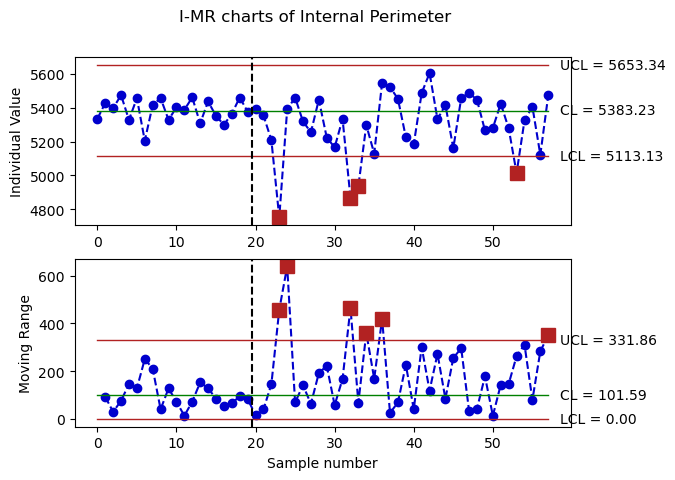

The part 4 is defected along the internal perimeter
The part 13 is defected along the internal perimeter
The part 14 is defected along the internal perimeter
The part 34 is defected along the internal perimeter
Defect Data:
4 H 4751.508238196373
13 H 4869.005716443062
14 H 4936.887969017029
34 H 5013.8168967962265


In [ ]:
# Internal perimeter
data_IMR_IP = qda.ControlCharts.IMR(data_tot, 'Internal Perimeter',K=3, subset_size=len(df))

valuesIP=df['Internal Perimeter']
moving_rangeIP = valuesIP.diff().abs()
mean_rangeIP = np.mean(moving_rangeIP)
meanIP = np.mean(valuesIP)

valuesIP_TT = df_TT_random['Internal Perimeter']

UCL_I_IP = meanIP + (3*mean_rangeIP/d2)
CL_I_IP = meanIP
LCL_I_IP = meanIP - (3*mean_rangeIP/d2)
UCL_MR_IP = D4*mean_rangeIP
CL_MR_IP = mean_rangeIP
LCL_MR = 0

defect_indicesIP = []
part_type_defectIP = []
defect_values_IP = []

for i in range(len(cropped_imageTT)):
    if valuesIP_TT[i] > UCL_I_IP or valuesIP_TT[i] < LCL_I_IP:
        defect_indicesIP.append(i+1)
        part_type_defectIP.append(df_TT_random.iloc[i, -1])
        defect_values_IP.append(df_TT_random.iloc[i, 1])
        print(f'The part {i+1} is defected along the internal perimeter')

defect_data = list(zip(defect_indicesIP, part_type_defectIP, defect_values_IP))

# Print the index, the part type and the parameter's value
print("Defect Data:")
for indexIP, value_typeIP, value_defectIP in defect_data:
    print(indexIP, value_typeIP, value_defectIP)


This parameter is quite reliable, because it detects all the "hole" defect type but only 4 parts, out of 8, are detected.

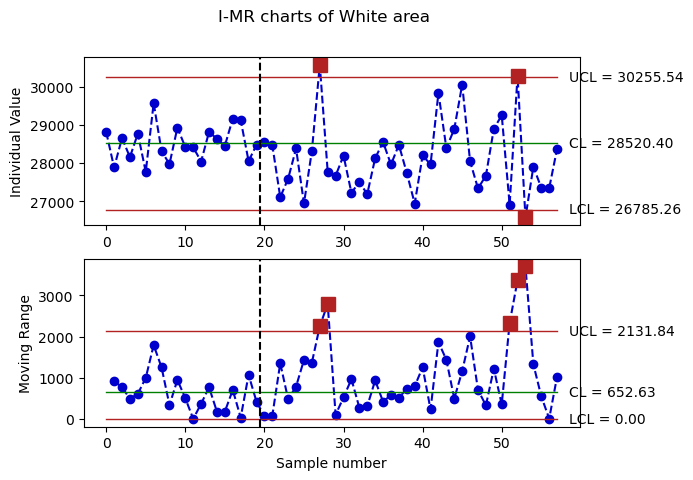

The part 8 is defected along the area
The part 33 is defected along the area
The part 34 is defected along the area
Defect Data:
8 MS 30568
33 MS 30285
34 H 26579


In [ ]:
# Area
data_IMR_A = qda.ControlCharts.IMR(data_tot, 'White area',K=3, subset_size=len(df))

valuesA=df['White area']
moving_rangeA = valuesA.diff().abs()
mean_rangeA = np.mean(moving_rangeA)
meanA = np.mean(valuesA)

valuesA_TT = df_TT_random['White area']

UCL_I_A = meanA + (3*mean_rangeA/d2)
CL_I_A = meanA
LCL_I_A = meanA - (3*mean_rangeA/d2)
UCL_MR_A = D4*mean_rangeA
CL_MR_A = mean_rangeA
LCL_MR = 0
defect_indicesA = []
part_type_defectA = []
defect_values_A = []

for i in range(len(cropped_imageTT)):
    if valuesA_TT[i] > UCL_I_A or valuesA_TT[i] < LCL_I_A:
        defect_indicesA.append(i+1)
        part_type_defectA.append(df_TT_random.iloc[i, -1])
        defect_values_A.append(df_TT_random.iloc[i, 2])
        print(f'The part {i+1} is defected along the area')

defect_data = list(zip(defect_indicesA, part_type_defectA, defect_values_A))

# Print the index, the part type and the parameter's value
print("Defect Data:")
for indexA, value_typeA, value_defectA in defect_data:
    print(indexA, value_typeA, value_defectA)

This parameter is not so reliable because only 3 parts are detected and they are not of the same type. We can conclude that the global area of all the parts, defected and not, are quite the same.

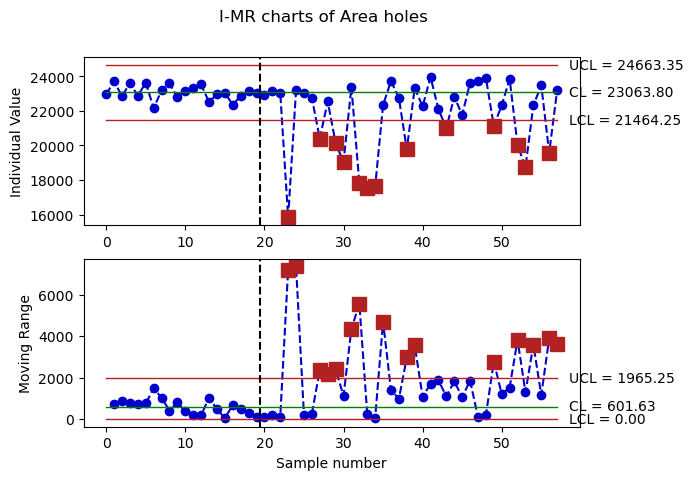

The part 4 is defected along the area of holes
The part 8 is defected along the area of holes
The part 10 is defected along the area of holes
The part 11 is defected along the area of holes
The part 13 is defected along the area of holes
The part 14 is defected along the area of holes
The part 15 is defected along the area of holes
The part 19 is defected along the area of holes
The part 24 is defected along the area of holes
The part 30 is defected along the area of holes
The part 33 is defected along the area of holes
The part 34 is defected along the area of holes
The part 37 is defected along the area of holes
Defect Data:
4 H 15840
8 MS 20389
10 H 20152
11 H 19034
13 H 17814
14 H 17567
15 H 17635
19 MS 19773
24 MS 20999
30 MS 21123
33 MS 20027
34 H 18740
37 H 19579


In [ ]:
# Area holes
data_IMR_AH = qda.ControlCharts.IMR(data_tot, 'Area holes',K=3, subset_size=len(df))

valuesAH=df['Area holes']
moving_rangeAH = valuesAH.diff().abs()
mean_rangeAH = np.mean(moving_rangeAH)
meanAH = np.mean(valuesAH)

valuesAH_TT = df_TT_random['Area holes']

UCL_I_AH = meanAH + (3*mean_rangeAH/d2)
CL_I_AH = meanAH
LCL_I_AH = meanAH - (3*mean_rangeAH/d2)
UCL_MR_AH = D4*mean_rangeAH
CL_MR_AH = mean_rangeAH
LCL_MR = 0
defect_indicesAH = []
part_type_defectAH = []
defect_values_AH = []

for i in range(len(cropped_imageTT)):
    if valuesAH_TT[i] > UCL_I_AH or valuesAH_TT[i] < LCL_I_AH:
        defect_indicesAH.append(i+1)
        part_type_defectAH.append(df_TT_random.iloc[i, -1])
        defect_values_AH.append(df_TT_random.iloc[i, 4])
        print(f'The part {i+1} is defected along the area of holes')

defect_dataAH = list(zip(defect_indicesAH, part_type_defectAH, defect_values_AH))

# Print the index, the part type and the parameter's value
print("Defect Data:")
for indexAH, value_typeAH, value_defectAH in defect_dataAH:
    print(indexAH, value_typeAH, value_defectAH)


This parameter demonstrates a high level of reliability as it successfully detects all parts with a 'hole' defect. However, it only detects 5 out of the 8 parts with a 'missing structure' defect. This happens because the remaining three components have very small defects so they fall within the limits. Our model is not so accurate and for this reason, it is not able to detect all the "missing structure" defective parts.

3. In the previous phases of our analysis we concluded that the external perimeter parameter is very reliable to detect the components that are affected by defects on the side or on the corner.
The area of holes is quite reliable to detect components that are affected to "hole" or "missing structure" defect type.

During this third phase, the team has tested several methods to explore the possibility to effectively differentiate the different types of defects from each other.

First, we tried to differentiate the missing structure defect to the hole one.
We implemented several ways to differentiate these two type of defect. We plotted the charts of internal perimeter and the area of holes but for both of these defects the parameters have very close values to each other and it was not possible to distinguish them through these.
We implemented another way based on the analysis of the centroids: firstly we identified the centroids for each of the hole in the images, then we calculated the distances among the centroids and lastly we sum them. Below, the code is reported. For sake of simplicity we do not reported the piece of code of alterntive methods that do not give us any results.

In [ ]:
from skimage import measure
from scipy.spatial import distance

imagesH = cropped_imageTT[12:20]
imagesMS = cropped_imageTT[20:28]
sum_centroids_distanceH = []
sum_centroids_distanceMS = []

for i in range(len(imagesH)):
    # We removed too small area
    min_size = 15
    imagesH[i] = morphology.remove_small_holes(imagesH[i], min_size)

     # We removed too large area
    max_size = 1000
    imagesH[i] = ~morphology.remove_small_holes(~imagesH[i], max_size)

    labelsH = measure.label(255 - imagesH[i])
    propsH = measure.regionprops(labelsH)
    centresH = [propH.centroid for propH in propsH]
    # Calculation of distances between centroids
    distancesH = distance.cdist(centresH, centresH, metric='euclidean')
    sum_centroids_distanceH.append(np.sum(distancesH))
#print(sum_centroids_distanceH)

# Same procedure for MS parts
for i in range(len(imagesMS)):
    min_size = 15
    imagesMS[i] = morphology.remove_small_holes(imagesMS[i], min_size)

    max_size = 1000
    imagesMS[i] = ~morphology.remove_small_holes(~imagesMS[i], max_size)

    labelsMS = measure.label(255 - imagesMS[i])
    propsMS = measure.regionprops(labelsMS)
    centresMS = [propMS.centroid for propMS in propsMS]
    distancesMS = distance.cdist(centresMS, centresMS, metric='euclidean')
    sum_centroids_distanceMS.append(np.sum(distancesMS))
#print(sum_centroids_distanceMS)

/Users/lucreziarossi/opt/anaconda3/envs/qda_project/lib/python3.10/site-packages/skimage/_shared/utils.py:157: UserWarning: Any labeled images will be returned as a boolean array. Did you mean to use a boolean array?
  return func(*args, **kwargs)


Then we plot the I chart in order to understand if this procedure is able to distinguish the hole defect type to the missing struts. The output obtained is resumed in the "Results" section.

We tried also to distinguish broken corner from broken side. We tried several methods such as plotting the charts of the external perimeters of the two categories of defects and also the aspect ratios. Both methods do not give us any concrete results. The most satisfactory result is obtained by cropping the corners of the image and calculating the external perimeter for each corner and then sum together all the four corners.
At last, we constructed the I-chart on the broken side pieces since their perimeter on the corner should be shorter compared to the broken corner ones.


For simplicity, we decided to plot only one corner of the analyzed images to show how we decided to crop the corner, instead of all four corners. All images were initially plotted to ensure the correctness of the cropping, and then they were commented out.

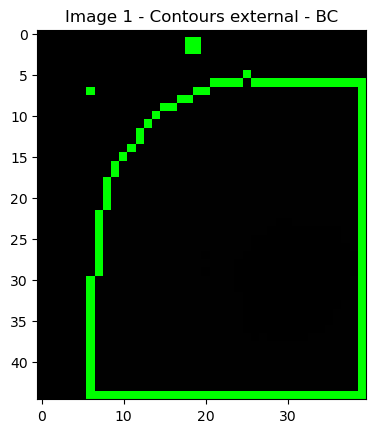

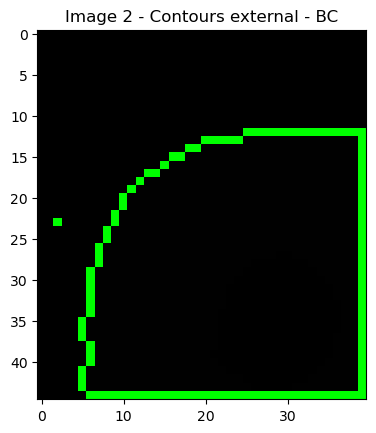

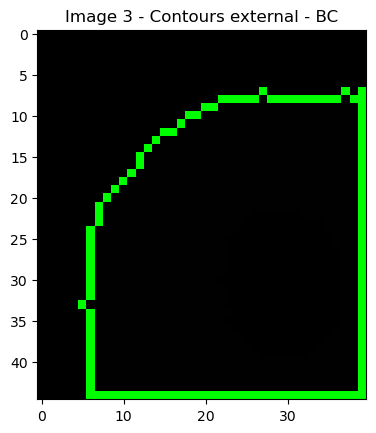

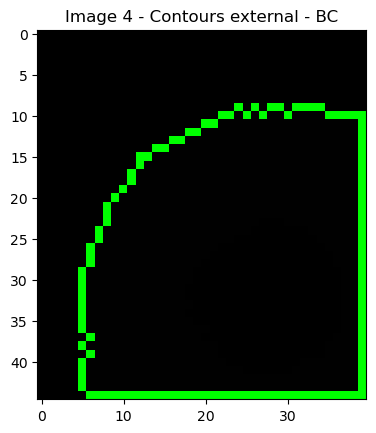

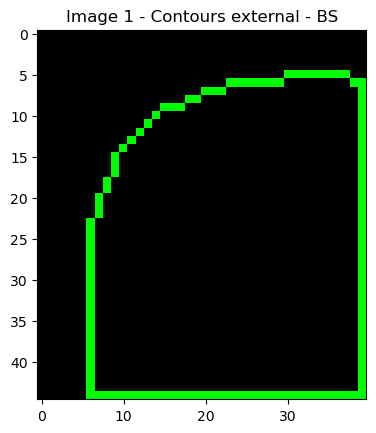

...

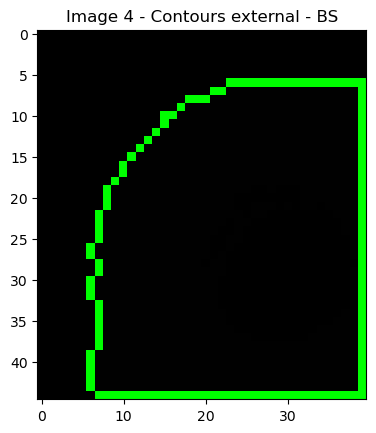

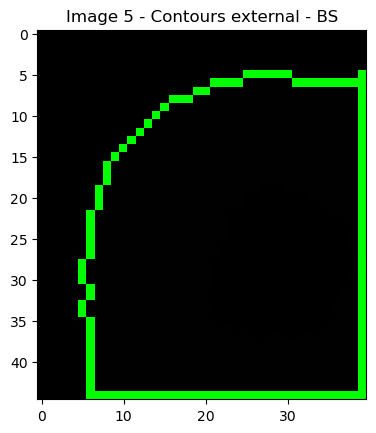

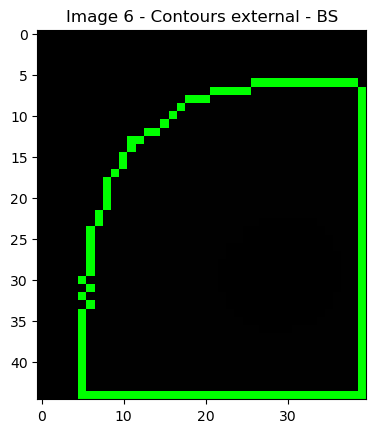

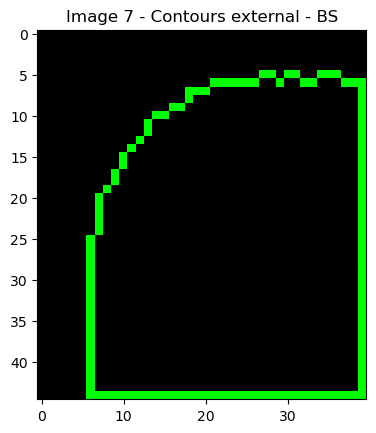

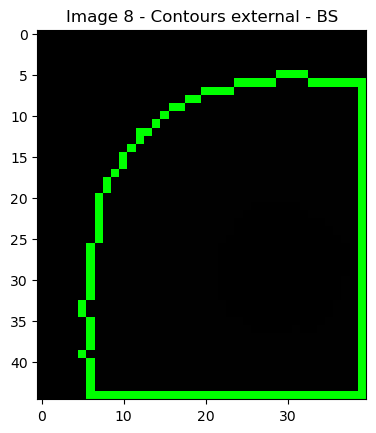

[139.79898929595947, 124.62741649150848, 134.28427076339722, 133.35533833503723]
[135.79898929595947, 138.28427076339722, 137.2132030725479, 135.45584380626678, 138.87005722522736, 137.4558436870575, 138.04163002967834, 137.4558435678482]


In [ ]:
# Corner 1
cropped_imageBC = cropped_imageTT[0:4]
cropped_imageBS = cropped_imageTT[4:12]
cropped_corner1_BC=[]
for i in range(len(cropped_imageBC)):
    x_1 = 0 # Here we give the coordinate to crop the corner
    y_1 = 0
    h_1 = 45
    w_1 = 40
    cropped_corner1_BC.append(cropped_imageBC[i][(y_1):(y_1+h_1), (x_1):(x_1+w_1)])
    #plt.imshow(cropped_corner1_BC[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext1_BC = []
image_contours_int1_BC = []
contours_ext1_BC = []
contours_int1_BC = []
for i in range(len(cropped_corner1_BC)):
 contours1, hierarchy1 = cv2.findContours(cropped_corner1_BC[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours1_BC=[]
 external_contours1_BC=[]

 for j in range(len(contours1)):
    if hierarchy1[0][j][3]==-1:
            external_contours1_BC.append(contours1[j])
    else:
            internal_contours1_BC.append(contours1[j])
 contours_ext1_BC.append(external_contours1_BC)
 contours_int1_BC.append(internal_contours1_BC)

 image_contours_ext1_BC.append(cv2.cvtColor(cropped_corner1_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext1_BC[i], external_contours1_BC, -1, (0,255,0),1)
 image_contours_int1_BC.append(cv2.cvtColor(cropped_corner1_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int1_BC[i], internal_contours1_BC, -1, (0,255,0),1)

  # Show the external contours of parts
for i in range(len(cropped_corner1_BC)):
 plt.imshow(image_contours_ext1_BC[i], cmap='gray')
 plt.title(f"Image {i+1} - Contours external - BC")
 plt.show()

cropped_corner1_BS=[]
for i in range(len(cropped_imageBS)):
    x_1 = 0 # Here we give the coordinate to crop the corner
    y_1 = 0
    h_1 = 45
    w_1 = 40
    cropped_corner1_BS.append(cropped_imageBS[i][(y_1):(y_1+h_1), (x_1):(x_1+w_1)])
    #plt.imshow(cropped_corner1_BS[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext1_BS = []
image_contours_int1_BS = []
contours_ext1_BS = []
contours_int1_BS = []
for i in range(len(cropped_corner1_BS)):
 contours1, hierarchy1 = cv2.findContours(cropped_corner1_BS[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours1_BS=[]
 external_contours1_BS=[]

 for j in range(len(contours1)):
    if hierarchy1[0][j][3]==-1:
            external_contours1_BS.append(contours1[j])
    else:
            internal_contours1_BS.append(contours1[j])
 contours_ext1_BS.append(external_contours1_BS)
 contours_int1_BS.append(internal_contours1_BS)

 image_contours_ext1_BS.append(cv2.cvtColor(cropped_corner1_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext1_BS[i], external_contours1_BS, -1, (0,255,0),1)
 image_contours_int1_BS.append(cv2.cvtColor(cropped_corner1_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int1_BS[i], internal_contours1_BS, -1, (0,255,0),1)

for i in range(len(cropped_corner1_BS)):
 plt.imshow(image_contours_ext1_BS[i], cmap='gray')
 plt.title(f"Image {i+1} - Contours external - BS")
 plt.show()

external_perimeter_corner1_BC = []

for i in range(len(cropped_corner1_BC)):
    # Calculation of perimeter of external contours
    perimeters_corner1_BC = [cv2.arcLength(contour1, True) for contour1 in contours_ext1_BC[i]]
    # Take the maximum perimeter
    external_perimeter_corner1_BC.append(sum(perimeters_corner1_BC))
print(external_perimeter_corner1_BC)

external_perimeter_corner1_BS = []

for i in range(len(cropped_corner1_BS)):
    # Calculation of perimeter of external contours
    perimeters_corner1_BS = [cv2.arcLength(contour1, True) for contour1 in contours_ext1_BS[i]]
    external_perimeter_corner1_BS.append(sum(perimeters_corner1_BS))
print(external_perimeter_corner1_BS)

In [ ]:
# Corner 2
cropped_corner2_BC=[]
for i in range(len(cropped_imageBC)):
    x_1 = 200 # Here we give the coordinate to crop the corner
    y_1 = 0
    h_1 = 45
    w_1 = 40
    cropped_corner2_BC.append(cropped_imageBC[i][(y_1):(y_1+h_1), (x_1):(x_1+w_1)])
    #plt.imshow(cropped_corner1_BC[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext2_BC = []
image_contours_int2_BC = []
contours_ext2_BC = []
contours_int2_BC = []
for i in range(len(cropped_corner2_BC)):
 contours2, hierarchy2 = cv2.findContours(cropped_corner2_BC[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours2_BC=[]
 external_contours2_BC=[]

 for j in range(len(contours2)):
    if hierarchy2[0][j][3]==-1:
            external_contours2_BC.append(contours2[j])
    else:
            internal_contours2_BC.append(contours2[j])
 contours_ext2_BC.append(external_contours2_BC)
 contours_int2_BC.append(internal_contours2_BC)

 image_contours_ext2_BC.append(cv2.cvtColor(cropped_corner2_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext2_BC[i], external_contours2_BC, -1, (0,255,0),1)
 image_contours_int2_BC.append(cv2.cvtColor(cropped_corner2_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int2_BC[i], internal_contours2_BC, -1, (0,255,0),1)

  # Show the external contours of parts
#for i in range(len(cropped_corner2_BC)):
 #plt.imshow(image_contours_ext2_BC[i], cmap='gray')
 #plt.title(f"Image {i+1} - Contours external")
 #plt.show()

# Broken side parts
cropped_corner2_BS=[]
for i in range(len(cropped_imageBS)):
    x_1bs = 200 # Here we give the coordinate to crop the corner
    y_1bs = 0
    h_1bs = 45
    w_1bs = 40
    cropped_corner2_BS.append(cropped_imageBS[i][(y_1bs):(y_1bs+h_1), (x_1bs):(x_1bs+w_1bs)])
    #plt.imshow(cropped_corner1_BS[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext2_BS = []
image_contours_int2_BS = []
contours_ext2_BS = []
contours_int2_BS = []
for i in range(len(cropped_corner2_BS)):
 contours2, hierarchy2 = cv2.findContours(cropped_corner2_BS[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours2_BS=[]
 external_contours2_BS=[]

 for j in range(len(contours2)):
    if hierarchy2[0][j][3]==-1:
            external_contours2_BS.append(contours2[j])
    else:
            internal_contours2_BS.append(contours2[j])
 contours_ext2_BS.append(external_contours2_BS)
 contours_int2_BS.append(internal_contours2_BS)

 image_contours_ext2_BS.append(cv2.cvtColor(cropped_corner2_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext2_BS[i], external_contours2_BS, -1, (0,255,0),1)
 image_contours_int2_BS.append(cv2.cvtColor(cropped_corner2_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int2_BS[i], internal_contours2_BS, -1, (0,255,0),1)

#for i in range(len(cropped_corner2_BS)):
 #plt.imshow(image_contours_ext2_BS[i], cmap='gray')
 #plt.title(f"Image {i+1} - Contours external")
 #plt.show()

external_perimeter_corner2_BC = []

for i in range(len(cropped_corner2_BC)):
    # Calculation of perimeter of external contours
    perimeters_corner2_BC = [cv2.arcLength(contour2, True) for contour2 in contours_ext2_BC[i]]
    # Take the maximum perimeter
    external_perimeter_corner2_BC.append(sum(perimeters_corner2_BC))
#print(external_perimeter_corner2_BC)

external_perimeter_corner2_BS = []

for i in range(len(cropped_corner2_BS)):
    # Calculation of perimeter of external contours
    perimeters_corner2_BS = [cv2.arcLength(contour2, True) for contour2 in contours_ext2_BS[i]]
    external_perimeter_corner2_BS.append(sum(perimeters_corner2_BS))
#print(external_perimeter_corner2_BS)

In [ ]:
# Corner 3
cropped_corner3_BC=[]
for i in range(len(cropped_imageBC)):
    x_3 = 200 # Here we give the coordinate to crop the corner
    y_3 = 200
    h_3 = 50
    w_3 = 45
    cropped_corner3_BC.append(cropped_imageBC[i][(y_3):(y_3+h_3), (x_3):(x_3+w_3)])
    #plt.imshow(cropped_corner1_BC[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext3_BC = []
image_contours_int3_BC = []
contours_ext3_BC = []
contours_int3_BC = []
for i in range(len(cropped_corner3_BC)):
 contours3, hierarchy3 = cv2.findContours(cropped_corner3_BC[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours3_BC=[]
 external_contours3_BC=[]

 for j in range(len(contours3)):
    if hierarchy3[0][j][3]==-1:
            external_contours3_BC.append(contours3[j])
    else:
            internal_contours3_BC.append(contours3[j])
 contours_ext3_BC.append(external_contours3_BC)
 contours_int3_BC.append(internal_contours3_BC)

 image_contours_ext3_BC.append(cv2.cvtColor(cropped_corner3_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext3_BC[i], external_contours3_BC, -1, (0,255,0),1)
 image_contours_int3_BC.append(cv2.cvtColor(cropped_corner3_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int3_BC[i], internal_contours3_BC, -1, (0,255,0),1)

  # Show the external contours of parts
#for i in range(len(cropped_corner3_BC)):
 #plt.imshow(image_contours_ext3_BC[i], cmap='gray')
 #plt.title(f"Image {i+1} - Contours external")
 #plt.show()

# Broken side parts
cropped_corner3_BS=[]
for i in range(len(cropped_imageBS)):
    x_3bs = 200 # Here we give the coordinate to crop the corner
    y_3bs = 200
    h_3bs = 45
    w_3bs = 40
    cropped_corner3_BS.append(cropped_imageBS[i][(y_3bs):(y_3bs+h_3bs), (x_3bs):(x_3bs+w_3bs)])
    #plt.imshow(cropped_corner1_BS[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext3_BS = []
image_contours_int3_BS = []
contours_ext3_BS = []
contours_int3_BS = []
for i in range(len(cropped_corner3_BS)):
 contours3, hierarchy3 = cv2.findContours(cropped_corner3_BS[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours3_BS=[]
 external_contours3_BS=[]

 for j in range(len(contours3)):
    if hierarchy3[0][j][3]==-1:
            external_contours3_BS.append(contours3[j])
    else:
            internal_contours3_BS.append(contours3[j])
 contours_ext3_BS.append(external_contours3_BS)
 contours_int3_BS.append(internal_contours3_BS)

 image_contours_ext3_BS.append(cv2.cvtColor(cropped_corner3_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext3_BS[i], external_contours3_BS, -1, (0,255,0),1)
 image_contours_int3_BS.append(cv2.cvtColor(cropped_corner3_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int3_BS[i], internal_contours3_BS, -1, (0,255,0),1)

#for i in range(len(cropped_corner3_BS)):
 #plt.imshow(image_contours_ext3_BS[i], cmap='gray')
 #plt.title(f"Image {i+1} - Contours external")
 #plt.show()

external_perimeter_corner3_BC = []

for i in range(len(cropped_corner3_BC)):
    # Calculation of perimeter of external contours
    perimeters_corner3_BC = [cv2.arcLength(contour3, True) for contour3 in contours_ext3_BC[i]]

    external_perimeter_corner3_BC.append(sum(perimeters_corner3_BC))
#print(external_perimeter_corner3_BC)

external_perimeter_corner3_BS = []

for i in range(len(cropped_corner3_BS)):
    # Calculation of perimeter of external contours
    perimeters_corner3_BS = [cv2.arcLength(contour3, True) for contour3 in contours_ext3_BS[i]]
    external_perimeter_corner3_BS.append(sum(perimeters_corner3_BS))
#print(external_perimeter_corner3_BS)

In [ ]:
# Corner 4
cropped_corner4_BC=[]
for i in range(len(cropped_imageBC)):
    x_4 = 0 # Here we give the coordinate to crop the corner
    y_4 = 195
    h_4 = 45
    w_4 = 45
    cropped_corner4_BC.append(cropped_imageBC[i][(y_4):(y_4+h_4), (x_4):(x_4+w_4)])
    #plt.imshow(cropped_corner1_BC[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext4_BC = []
image_contours_int4_BC = []
contours_ext4_BC = []
contours_int4_BC = []
for i in range(len(cropped_corner4_BC)):
 contours4, hierarchy4 = cv2.findContours(cropped_corner4_BC[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours4_BC=[]
 external_contours4_BC=[]

 for j in range(len(contours4)):
    if hierarchy4[0][j][3]==-1:
            external_contours4_BC.append(contours4[j])
    else:
            internal_contours4_BC.append(contours4[j])
 contours_ext4_BC.append(external_contours4_BC)
 contours_int4_BC.append(internal_contours4_BC)

 image_contours_ext4_BC.append(cv2.cvtColor(cropped_corner4_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext4_BC[i], external_contours4_BC, -1, (0,255,0),1)
 image_contours_int4_BC.append(cv2.cvtColor(cropped_corner4_BC[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int4_BC[i], internal_contours4_BC, -1, (0,255,0),1)

  # Show the external contours of parts
#for i in range(len(cropped_corner4_BC)):
 #plt.imshow(image_contours_ext4_BC[i], cmap='gray')
 #plt.title(f"Image {i+1} - Contours external")
 #plt.show()

# Broken side parts
cropped_corner4_BS=[]
for i in range(len(cropped_imageBS)):
    x_4bs = 0 # Here we give the coordinate to crop the corner
    y_4bs = 195
    h_4bs = 45
    w_4bs = 45
    cropped_corner4_BS.append(cropped_imageBS[i][(y_4bs):(y_4bs+h_4bs), (x_4bs):(x_4bs+w_4bs)])
    #plt.imshow(cropped_corner1_BS[i],cmap='gray')
    #plt.title(f"Image {i+1} - Rotated and cropped")
    #plt.show()

image_contours_ext4_BS = []
image_contours_int4_BS = []
contours_ext4_BS = []
contours_int4_BS = []
for i in range(len(cropped_corner4_BS)):
 contours4, hierarchy4 = cv2.findContours(cropped_corner4_BS[i], cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

 internal_contours4_BS=[]
 external_contours4_BS=[]

 for j in range(len(contours4)):
    if hierarchy4[0][j][3]==-1:
            external_contours4_BS.append(contours4[j])
    else:
            internal_contours4_BS.append(contours4[j])
 contours_ext4_BS.append(external_contours4_BS)
 contours_int4_BS.append(internal_contours4_BS)

 image_contours_ext4_BS.append(cv2.cvtColor(cropped_corner4_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_ext4_BS[i], external_contours4_BS, -1, (0,255,0),1)
 image_contours_int4_BS.append(cv2.cvtColor(cropped_corner4_BS[i],cv2.COLOR_GRAY2BGR ))
 cv2.drawContours(image_contours_int4_BS[i], internal_contours4_BS, -1, (0,255,0),1)

#for i in range(len(cropped_corner4_BS)):
 #plt.imshow(image_contours_ext4_BS[i], cmap='gray')
 #plt.title(f"Image {i+1} - Contours external")
 #plt.show()

external_perimeter_corner4_BC = []

for i in range(len(cropped_corner4_BC)):
    # Calculation of perimeter of external contours
    perimeters_corner4_BC = [cv2.arcLength(contour4, True) for contour4 in contours_ext4_BC[i]]

    external_perimeter_corner4_BC.append(sum(perimeters_corner4_BC))
#print(external_perimeter_corner4_BC)

external_perimeter_corner4_BS = []

for i in range(len(cropped_corner4_BS)):
    # Calculation of perimeter of external contours
    perimeters_corner4_BS = [cv2.arcLength(contour4, True) for contour4 in contours_ext4_BS[i]]
    external_perimeter_corner4_BS.append(sum(perimeters_corner4_BS))
#print(external_perimeter_corner4_BS)

In [ ]:

array_BC = np.array([external_perimeter_corner1_BC, external_perimeter_corner2_BC, external_perimeter_corner3_BC, external_perimeter_corner4_BC])
# Sum column
corner_perimeter_BC = np.sum(array_BC, axis=0)
corner_perimeter_BC = corner_perimeter_BC.reshape(-1, 1)
#print(corner_perimeter_BC)

array_BS = np.array([external_perimeter_corner1_BS, external_perimeter_corner2_BS, external_perimeter_corner3_BS, external_perimeter_corner4_BS])
corner_perimeter_BS = np.sum(array_BS, axis=0)
corner_perimeter_BS = corner_perimeter_BS.reshape(-1, 1)
#print(corner_perimeter_BS)

The results obtained are resumed in the "Results" section.

# Results

In our second phase, we were able to correctly identify using the external perimeter and the area of the holes the defected parts from the in-control one. The IMR-charts are reported below:

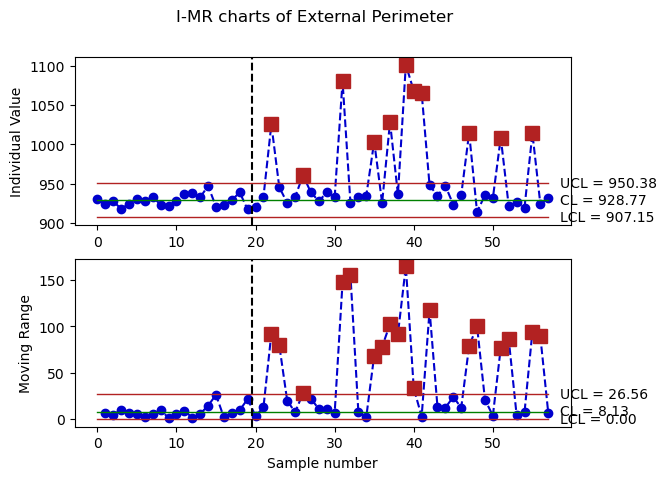

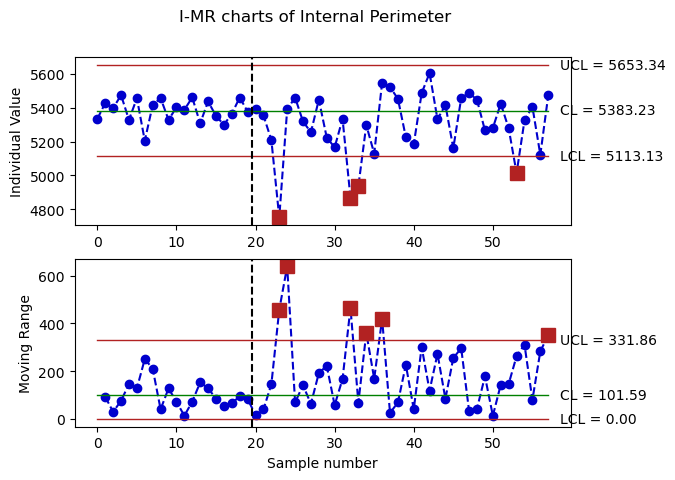

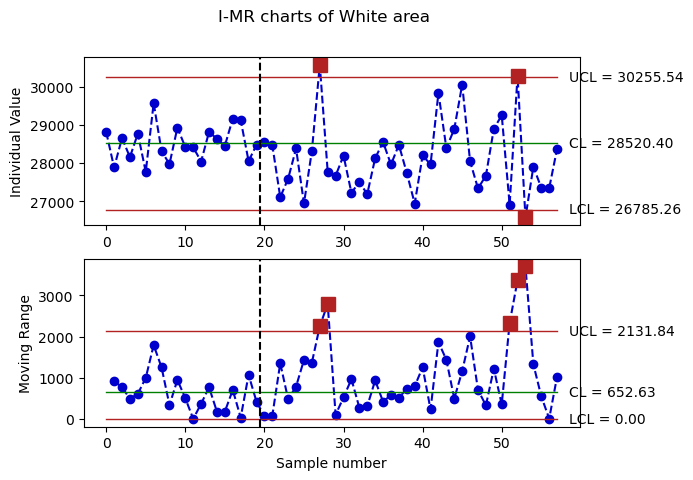

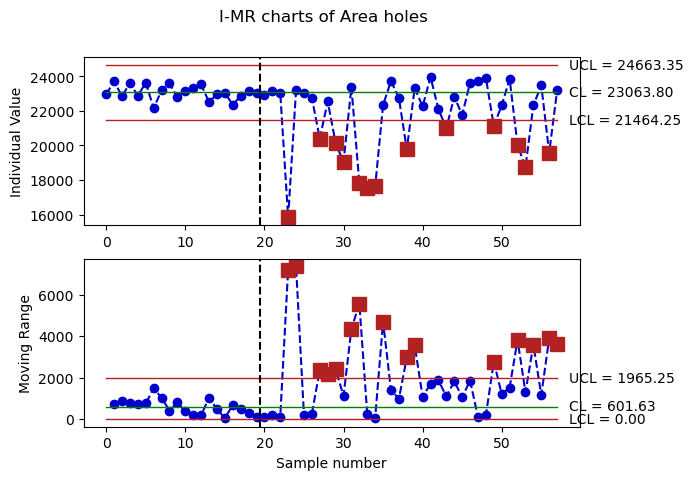

In [ ]:
data_IMR_EP = qda.ControlCharts.IMR(data_tot, 'External Perimeter',K=3, subset_size=len(df))
data_IMR_IP = qda.ControlCharts.IMR(data_tot, 'Internal Perimeter',K=3, subset_size=len(df))
data_IMR_A = qda.ControlCharts.IMR(data_tot, 'White area',K=3, subset_size=len(df))
data_IMR_AH = qda.ControlCharts.IMR(data_tot, 'Area holes',K=3, subset_size=len(df))

As we can see from the previous graphs and the previous considerations, the most reliable parameters to detect defective parts are the external perimeter and the area of holes. The external perimeter parameter is able to detect the 100% of broken side parts and only three out of four parts of broken corner part type are detected. The part that is not detected is the one that is not well binarized. We can conclude that this parameter can efficiently detect almost all the defects along the external perimeter.

The area of holes is quite reliable as well, since it was able to detect all the parts of hole type and the 62.5% of the missing structure parts.

We can conclude that not all the defective pieces on a determined parameter are out of control. For the external perimeter we can assert that in our model we have 1 false positives while for the area of holes we have 3 false positives.

In the third phase we tried to distinguish the different types of error. We selected the sum of the distances between the centroids as the discriminant to separate 'lack of struts' pieces from the 'hole' ones. The corresponding I-chart is shown below:

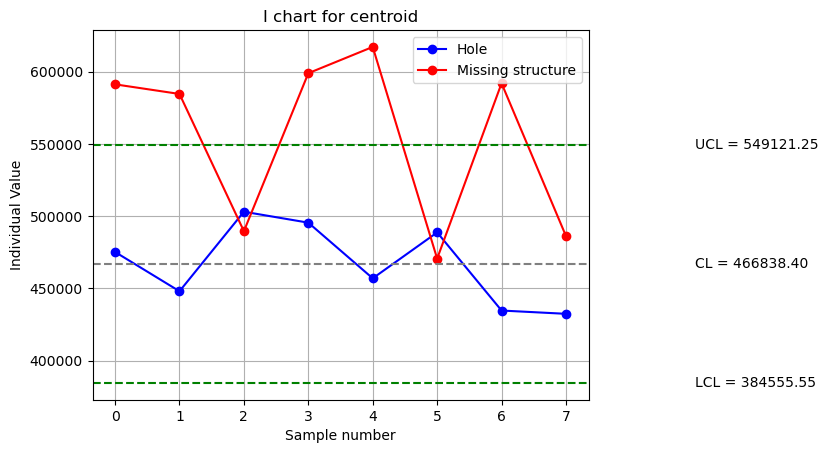

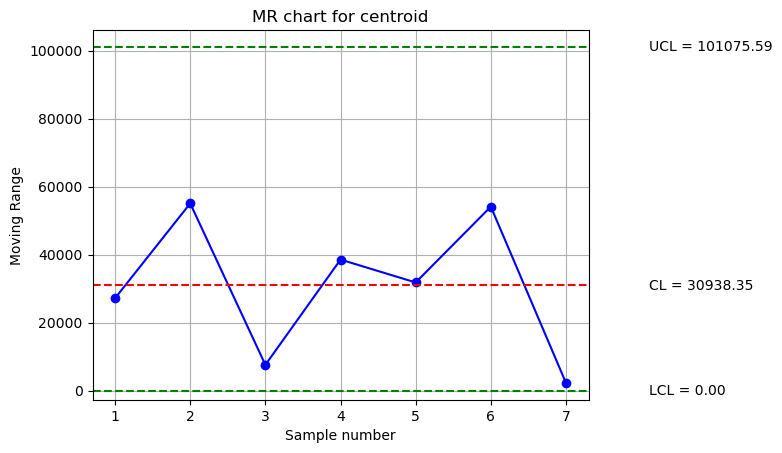

The part 1 is MS
The part 2 is MS
The part 4 is MS
The part 5 is MS
The part 7 is MS


In [ ]:
# Plot the I chart
d2 = 1.128
D4 = 3.267
sum_centroids_distanceH = pd.Series(sum_centroids_distanceH)
moving_rangeH = sum_centroids_distanceH.diff().abs()
mean_rangeH = np.mean(moving_rangeH)

meanH = np.mean(sum_centroids_distanceH)


UCL_I = meanH +(3*mean_rangeH)/d2
CL_I = meanH
LCL_I = meanH - (3*mean_rangeH)/d2
UCL_MR = D4*mean_rangeH
CL_MR = mean_rangeH
LCL_MR = 0


plt.title('I chart for centroid')
plt.plot(sum_centroids_distanceH, color='b', linestyle='-', marker='o', label='Hole')
plt.plot(sum_centroids_distanceMS, color='r', linestyle='-', marker='o', label = 'Missing structure')
plt.axhline(UCL_I, color='g', linestyle='--')
plt.axhline(CL_I, color='gray', linestyle='--')
plt.axhline(LCL_I, color='g', linestyle='--')
plt.legend()
plt.ylabel('Individual Value')
plt.xlabel('Sample number')


# add the values of the control limits on the right side of the plot
plt.text(len(sum_centroids_distanceH)+1, UCL_I, 'UCL = {:.2f}'.format(UCL_I), verticalalignment='center')
plt.text(len(sum_centroids_distanceH)+1, CL_I, 'CL = {:.2f}'.format(CL_I), verticalalignment='center')
plt.text(len(sum_centroids_distanceH)+1, LCL_I, 'LCL = {:.2f}'.format(LCL_I), verticalalignment='center')
plt.grid()
plt.show()

# Plot the MR control chart
plt.title('MR chart for centroid')
plt.plot(moving_rangeH, color='b', linestyle='-', marker='o')
plt.axhline(y=UCL_MR, color='g', linestyle='--')
plt.axhline(y=CL_MR, color='r', linestyle='--')
plt.axhline(y=LCL_MR, color='g', linestyle='--')
plt.ylabel('Moving Range')
plt.xlabel('Sample number')

# add the values of the control limits
plt.text(len(moving_rangeH)+.1, UCL_MR, 'UCL = {:.2f}'.format(UCL_MR), verticalalignment='center')
plt.text(len(moving_rangeH)+.1, CL_MR, 'CL = {:.2f}'.format(CL_MR), verticalalignment='center')
plt.text(len(moving_rangeH)+.1, LCL_MR, 'LCL = {:.2f}'.format(LCL_MR), verticalalignment='center')
plt.grid()
plt.show()


defect_indicesMS = []
part_type_defectMS = []

for i in range(len(imagesMS)):
    if sum_centroids_distanceMS[i] > UCL_I or sum_centroids_distanceMS[i] < LCL_I:
        defect_indicesMS.append(i+1)
        print(f'The part {i+1} is MS')

Since our model is not so accurate, only 5 out of 8 hole defected pieces can be distinguished from missing structs defected pieces, which corresponds to the 62.5%.

Not all the missing structs defects are detected and probably this can be justified by the low accuracy of the model and the low availability of data.

The 'broken side' and 'broken corner' pieces were identifyed using an I-chart built on the external perimeter of the corners only, as shown below:

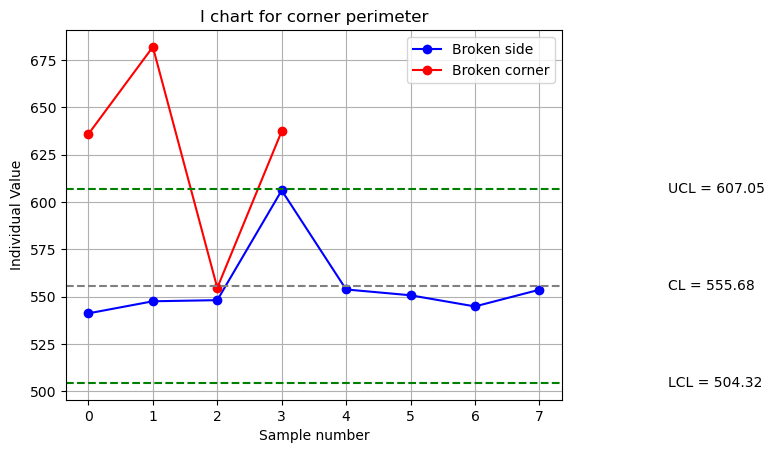

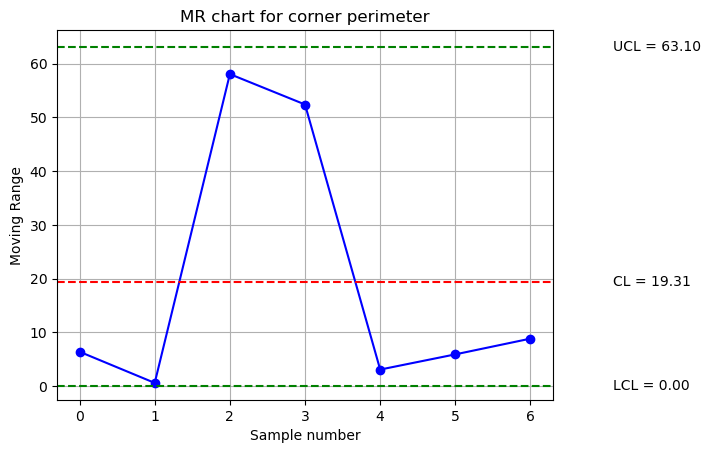

In [ ]:
# Plot the I-MR control chart
d2 = 1.128
D4 = 3.267
valid_indices = np.isfinite(corner_perimeter_BS)
corner_perimeter_BS_valid = corner_perimeter_BS[valid_indices]
moving_rangeBS = np.abs(np.diff(corner_perimeter_BS_valid))
mean_rangeBS = np.mean(moving_rangeBS)

meanBS = np.mean(corner_perimeter_BS)

UCL_I = meanBS +(3*mean_rangeBS)/d2
CL_I = meanBS
LCL_I = meanBS - (3*mean_rangeBS)/d2
UCL_MR = D4*mean_rangeBS
CL_MR = mean_rangeBS
LCL_MR = 0


plt.title('I chart for corner perimeter')
plt.plot(corner_perimeter_BS, color='b', linestyle='-', marker='o', label='Broken side')
plt.plot(corner_perimeter_BC, color='r', linestyle='-', marker='o', label = 'Broken corner')
plt.axhline(UCL_I, color='g', linestyle='--')
plt.axhline(CL_I, color='gray', linestyle='--')
plt.axhline(LCL_I, color='g', linestyle='--')
plt.legend()
plt.ylabel('Individual Value')
plt.xlabel('Sample number')


# add the values of the control limits on the right side of the plot
plt.text(len(corner_perimeter_BS)+1, UCL_I, 'UCL = {:.2f}'.format(UCL_I), verticalalignment='center')
plt.text(len(corner_perimeter_BS)+1, CL_I, 'CL = {:.2f}'.format(CL_I), verticalalignment='center')
plt.text(len(corner_perimeter_BS)+1, LCL_I, 'LCL = {:.2f}'.format(LCL_I), verticalalignment='center')
plt.grid()
plt.show()


# Plot the MR control chart
plt.title('MR chart for corner perimeter')
plt.plot(moving_rangeBS, color='b', linestyle='-', marker='o')
plt.axhline(y=UCL_MR, color='g', linestyle='--')
plt.axhline(y=CL_MR, color='r', linestyle='--')
plt.axhline(y=LCL_MR, color='g', linestyle='--')
plt.ylabel('Moving Range')
plt.xlabel('Sample number')

# add the values of the control limits
plt.text(len(moving_rangeBS)+.1, UCL_MR, 'UCL = {:.2f}'.format(UCL_MR), verticalalignment='center')
plt.text(len(moving_rangeBS)+.1, CL_MR, 'CL = {:.2f}'.format(CL_MR), verticalalignment='center')
plt.text(len(moving_rangeBS)+.1, LCL_MR, 'LCL = {:.2f}'.format(LCL_MR), verticalalignment='center')
plt.grid()
plt.show()

The obtained result is considered good because the broken corner defective parts are outside the control limits. However, part 3 is within the limits because, as stated before, its defect cannot be accurately binarized. Therefore, when binarized, it appears to be a part that is in control. This situation may be attributed to a Type 2 error.

A Type 2 error refers to a statistical error where a false negative result occurs. In this context, it means that the defect in part 3 is not accurately detected as it should be. The binarization process fails to identify the defect, leading to the part being classified as in control when it is actually defective. This can happen when the defect characteristics are challenging to distinguish from normal variations, resulting in a failure to correctly classify the part as defective.

This type of error can occur due to various factors such as limitations of the detection method or the complexity of the defects themselves. In this case, the inability to accurately binarize the defect in part 3 contributes to the Type 2 error.



In conclusion, we have very few data to consider this procedure accurate to distinguish one defect from the others. Our model based on 20 images probably has a low accuracy and with more sample the statistics would be more powerful in deceting the in control data.

# References (if any)